# Practical Clustering




In [1]:
import numpy as np
import h5py
import pandas as pd
import matplotlib.pyplot as plt
import glob
from sklearn.cluster import KMeans
from sklearn.cluster import AgglomerativeClustering
import sys
from sklearn.preprocessing import scale
from sklearn.preprocessing import MinMaxScaler
from sklearn.decomposition import PCA
from scipy import signal
import IPython.display as ipd
%matplotlib inline
import seaborn as sns
import pandas as pd
import scipy.io.wavfile as wavfile
from scipy import stats
import math

In [2]:
global filelist
global features_list
global final_filelist
global tract_filelist
global PTNE_filelist
global sound_filelist

filelist = []
tract_filelist=[]
PTNE_filelist=[]
sound_filelist=[]

In [3]:
# One function to make a tract PTNE and sound filelist by entering file names, and play the sound
def make_filelist():
    name = input("Enter the filename: ")  #get the file name of the wav file
    tract_filename='/home/meitao/Desktop/AML_files/ESC-50-Processed/tracts/hdf5/2019-10-31/' + name + '.1.hdf5'
    PTNE_filename='/home/meitao/Desktop/AML_files/ESC-50-Processed/ptne/hdf5/2019-10-31/' + name + '.1.hdf5'
    sound_filename='/home/meitao/Desktop/ESC-50/audio/' + name
    
    filelist.append(name)
    tract_filelist.append(tract_filename)
    PTNE_filelist.append(PTNE_filename)
    sound_filelist.append(sound_filename)
    return ipd.Audio(sound_filename)
   # return filelist

In [4]:
# use this function to choose 6 different sound and make lists for them
#make_filelist()

In [5]:
# Read meta data, choose 6 classes for clustering assignment
esc50 = pd.read_csv('/home/meitao/Desktop/ESC-50/meta/esc50.csv')
drop_list=[]
for i in range(35):
    drop_list.append(i)
esc50_3 = esc50.loc[esc50['target'] == 3].reset_index(level=0,drop=True).drop(drop_list,axis=0)
esc50_10 = esc50.loc[esc50['target'] == 10].reset_index(level=0,drop=True).drop(drop_list,axis=0)
esc50_18 = esc50.loc[esc50['target'] == 18].reset_index(level=0,drop=True).drop(drop_list,axis=0)
esc50_38 = esc50.loc[esc50['target'] == 38].reset_index(level=0,drop=True).drop(drop_list,axis=0)
esc50_42 = esc50.loc[esc50['target'] == 42].reset_index(level=0,drop=True).drop(drop_list,axis=0)
esc50_47 = esc50.loc[esc50['target'] == 47].reset_index(level=0,drop=True).drop(drop_list,axis=0)

In [6]:
esc50_test=esc50_3.append(esc50_10)
esc50_test=esc50_test.append(esc50_18)
esc50_test=esc50_test.append(esc50_38)
esc50_test=esc50_test.append(esc50_42)
esc50_test=esc50_test.append(esc50_47)
esc50_test=esc50_test.reset_index(level=0,drop=True)
esc50_test=esc50_test.drop(['fold','esc10','src_file','take'],axis=1)
esc50_test
#I choose 6 classes of sound, and each class has 5 similar sound

,filename,target,category
0,5-194899-D-3.wav,3,cow
1,5-202795-A-3.wav,3,cow
2,5-242492-A-3.wav,3,cow
3,5-253085-A-3.wav,3,cow
4,5-253085-B-3.wav,3,cow
5,5-194892-A-10.wav,10,rain
6,5-195710-A-10.wav,10,rain
7,5-198321-A-10.wav,10,rain
8,5-202898-A-10.wav,10,rain
9,5-203739-A-10.wav,10,rain


In [7]:
filelist=[]
for index, row in esc50_test.iterrows():
    #using functions to get the feature values and store them in the list
    filename=row['filename']
    filelist.append(filename)

In [8]:
# function to plot spectrom, PTNE, and tract features
def plt_file():
    print(filelist)
    
    ################ plot spectrogram
    for filename in filelist:
        plt.figure(figsize=(20,10))
        soundfile='/home/meitao/Desktop/ESC-50/audio/' + filename
        sample_rate, samples = wavfile.read(soundfile)
        frequencies, times, spectrogram = signal.spectrogram(samples, sample_rate)
        #print(sample_rate,samples)
        #print(spectrogram.shape)
        ###########################   4 2 1   spectrogram
        plt.subplot(4,2,1)
        
        title=filename+' spectrogram:'
        plt.title(title)
        plt.pcolormesh(times, frequencies, np.log(spectrogram)) # take log 10 of spectrogram
        plt.ylabel('Frequency [Hz]')
        plt.xlabel('Time [sec]')
        plt.colorbar()
        
        
        ###############   tract feature   ################
        tract_filename='/home/meitao/Desktop/AML_files/ESC-50-Processed/tracts/hdf5/2019-10-31/' + filename + '.1.hdf5' 
        tract_file=h5py.File(tract_filename, 'r')

        E_tract = np.array(tract_file['E'])
        E_tract = np.log(E_tract)
        s_tract = tract_file['s_tract']
        f_tract = tract_file['f_tract']  
       
    
        #########################  4 2 2  plot E
        plt.subplot(4,2,2)
        title=filename+' E feature:'
        plt.title(title)
        plt.imshow(E_tract,aspect='auto',origin='lower')
        plt.colorbar()
        #########################  4 2 3  plot s_tract
        plt.subplot(4,2,3)
        title=filename+' s_tract feature:'
        plt.title(title)
        plt.imshow(s_tract,aspect='auto',origin='lower')
        plt.colorbar()
        #########################  4 2 4  plot f_tract
        plt.subplot(4,2,4)
        title=filename+' f_tract feature:'
        plt.title(title)
        plt.imshow(f_tract,aspect='auto',origin='lower')
        plt.colorbar()
        
       
    
        ############    PTNE part   #########
        ptne_filename='/home/meitao/Desktop/AML_files/ESC-50-Processed/ptne/hdf5/2019-10-31/' + filename + '.1.hdf5'
        ptne_file=h5py.File(ptne_filename, 'r')
        
        pulse = ptne_file['pulse']
        #########################  4 2 5  plot P
        plt.subplot(4,2,5)
        title=filename+' Pulse feature:'
        plt.title(title)
        plt.imshow(pulse,aspect='auto',origin='lower')
        plt.colorbar()
        
        tone = ptne_file['tone']
        #########################  4 2 6  plot T
        plt.subplot(4,2,6)
        title=filename+' Tone feature:'
        plt.title(title)
        plt.imshow(tone,aspect='auto',origin='lower')
        plt.colorbar()
        
        noise = ptne_file['noise']
        #########################  4 2 7 plot N
        plt.subplot(4,2,7)
        title=filename+' Noise feature:'
        plt.title(title)
        plt.imshow(noise,aspect='auto',origin='lower')
        plt.colorbar()
        
        energy = ptne_file['energy']
        #########################  4 2 8  plot E
        plt.subplot(4,2,8)
        title=filename+' Energy feature:'
        plt.title(title)
        plt.imshow(energy,aspect='auto',origin='lower')
        plt.colorbar()
        
        
        plt.subplots_adjust(hspace=0.6)            
        plt.show()

### Try to achieve the following:

 * Two visualizations of the unclustered data. Please familiarize yourself with the raw data. Provide a caption for each image to explain what is shown in the picture.
  * I plot 1.spectrogram 2.E s_tract & f_tract features 3. PTNE features for all 30 sound files I choose.

['5-194899-D-3.wav', '5-202795-A-3.wav', '5-242492-A-3.wav', '5-253085-A-3.wav', '5-253085-B-3.wav', '5-194892-A-10.wav', '5-195710-A-10.wav', '5-198321-A-10.wav', '5-202898-A-10.wav', '5-203739-A-10.wav', '5-185908-A-18.wav', '5-197913-A-18.wav', '5-201664-A-18.wav', '5-202020-A-18.wav', '5-202540-A-18.wav', '5-209833-A-38.wav', '5-210571-A-38.wav', '5-212181-A-38.wav', '5-219342-A-38.wav', '5-235671-A-38.wav', '5-133989-A-42.wav', '5-133989-B-42.wav', '5-150409-A-42.wav', '5-160551-A-42.wav', '5-184323-A-42.wav', '5-235956-A-47.wav', '5-251957-A-47.wav', '5-251962-A-47.wav', '5-251963-A-47.wav', '5-251971-A-47.wav']


/home/meitao/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RuntimeWarning: divide by zero encountered in log


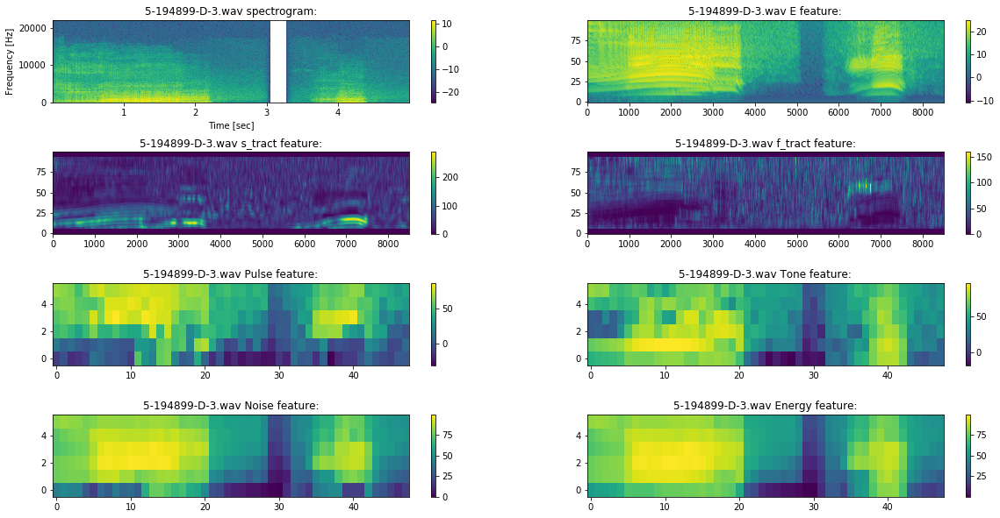

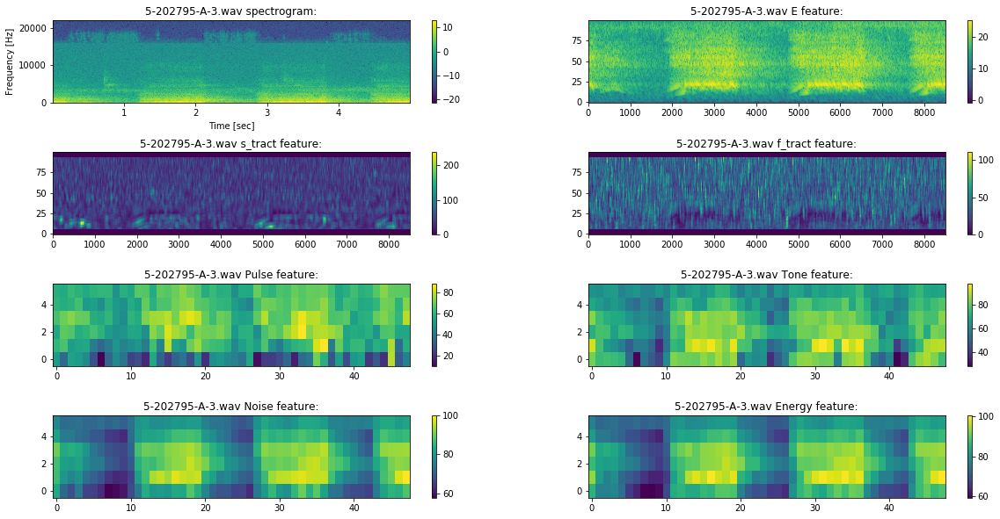

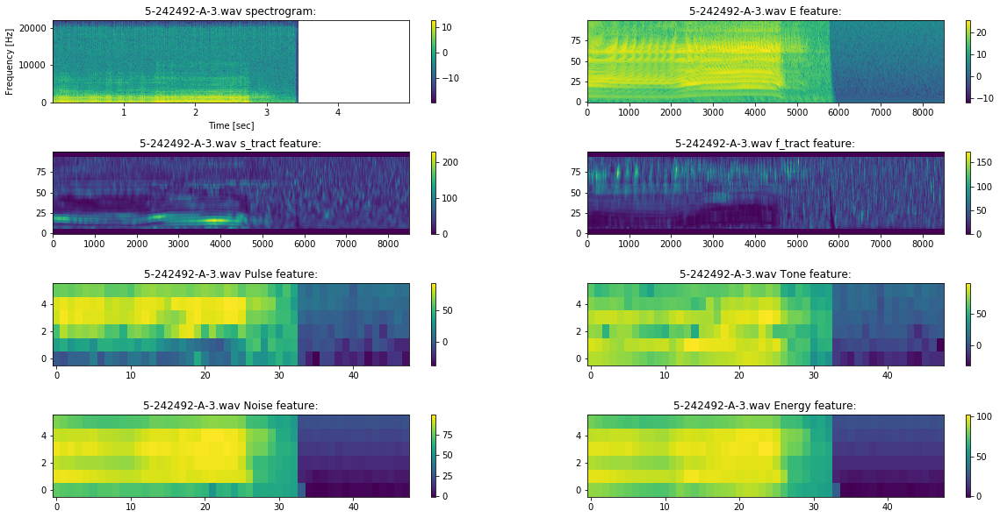

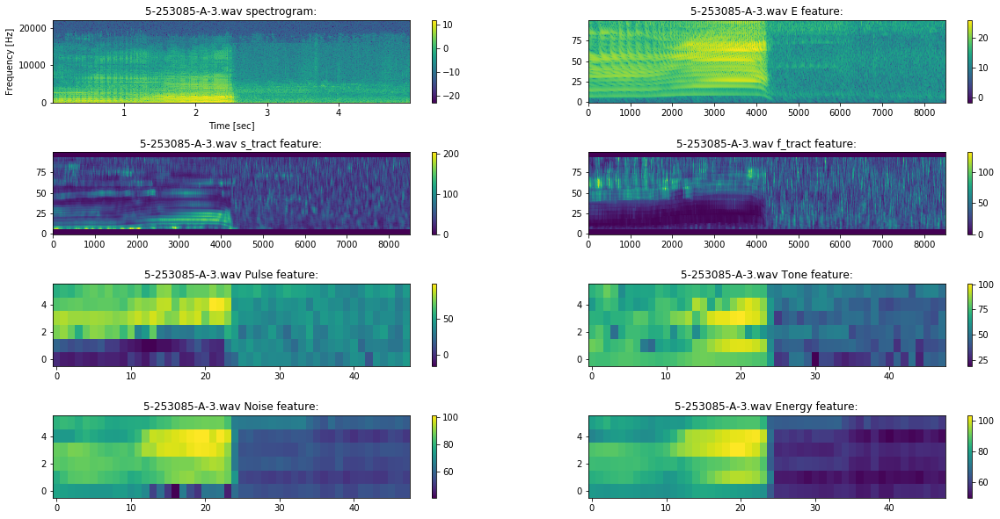

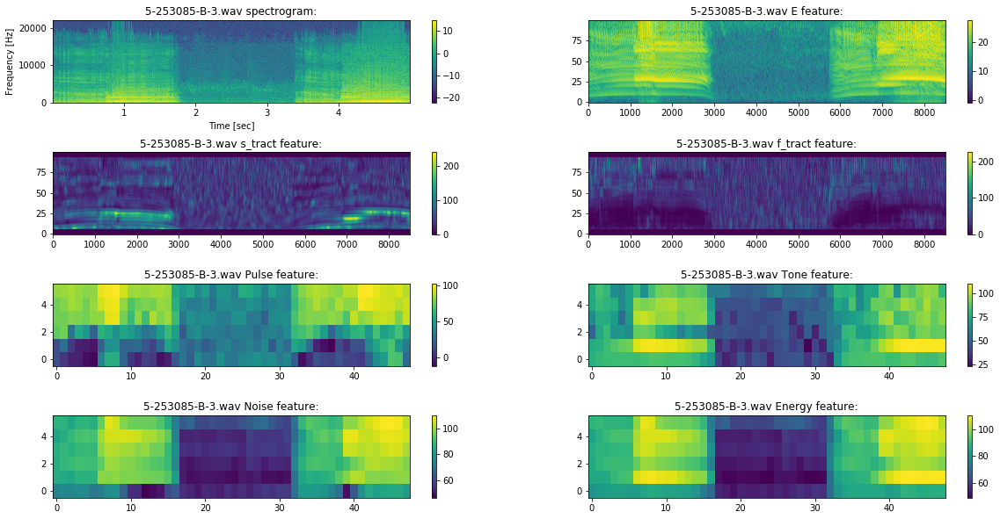

...

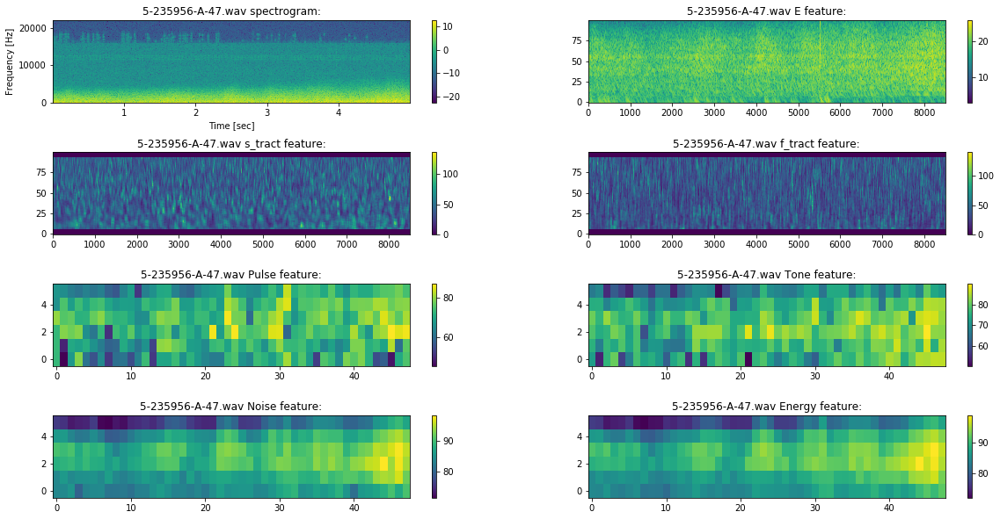

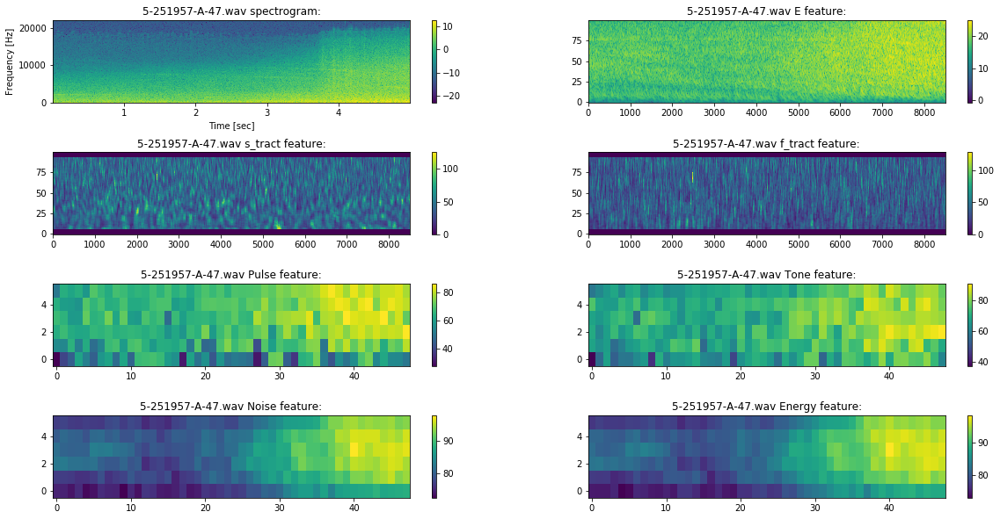

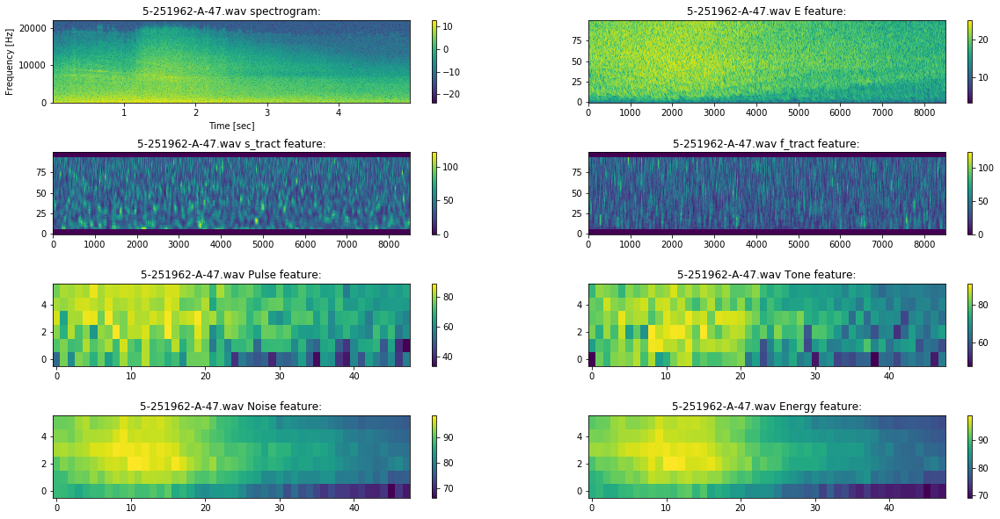

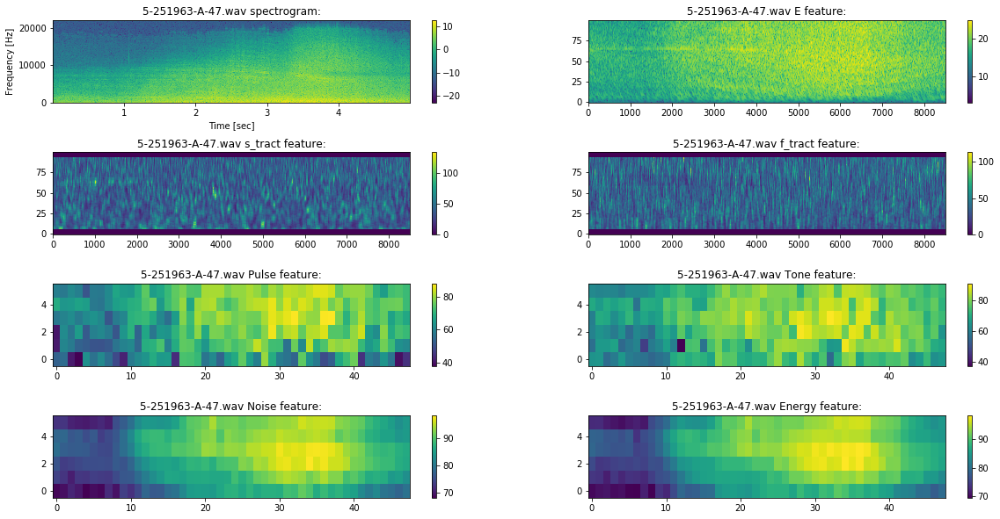

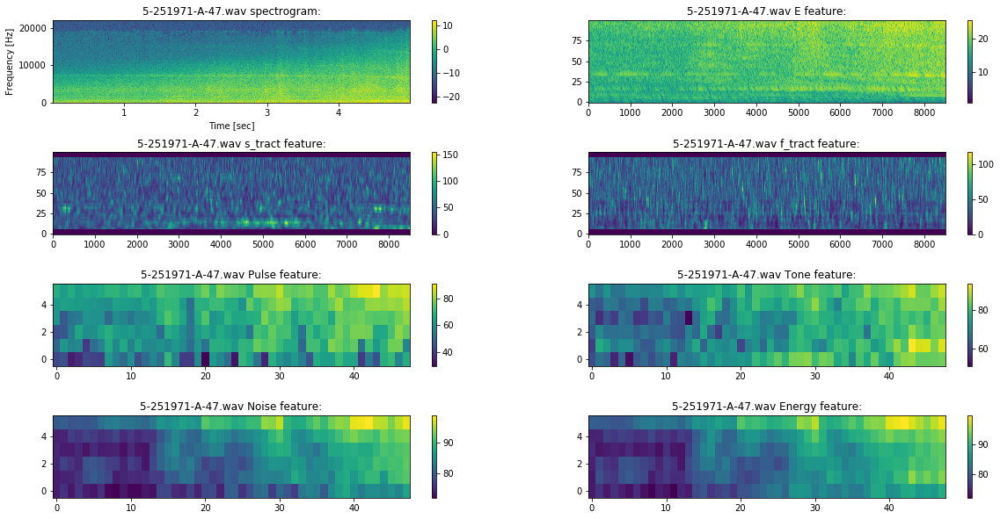

In [9]:
#plot 1.spectrogram 2.E s_tract & f_tract features 3. PTNE features for the sounds I choose
plt_file()

* In order to implement clustering, I need to extract features first. I defined some functions to do that.

In [10]:
##   function to extract features(MAX  MIN  MEAN) from PTNE
def extract_features_max_min_mean():    
    features_list = []
    for file in filelist:
        ptne_address='/home/meitao/Desktop/AML_files/ESC-50-Processed/ptne/hdf5/2019-10-31/' + file + '.1.hdf5'
        ptne_file = h5py.File(ptne_address,'r')
        
        pulse = ptne_file['pulse']
        tone = ptne_file['tone']
        noise = ptne_file['noise']
        energy = ptne_file['energy']
        
        m,n = pulse.shape
      #  print(m,n)
                   
        
#######################################   MAX MIN features for each line of each file        
        for i in range(m):# for each row of one of the features***********   6 rows   ********
            #max and min features
                   
            p_max=np.max(pulse[i])
            p_min=np.min(pulse[i])
            p_mean=np.mean(pulse[i])
            
            t_max=np.max(tone[i])
            t_min=np.min(tone[i])
            t_mean=np.mean(tone[i])
            
            n_max=np.max(noise[i])
            n_min=np.min(noise[i])
            n_mean=np.mean(noise[i])  
            
            e_max=np.max(energy[i])
            e_min=np.min(energy[i])
            e_mean=np.mean(energy[i])            

            # append all features into the list   ***********12 features    ******
            features_list.append(p_max)
            features_list.append(p_min)
            features_list.append(p_mean)
            
            features_list.append(t_max)
            features_list.append(t_min)
            features_list.append(t_mean)
            
            features_list.append(n_max)
            features_list.append(n_min)
            features_list.append(n_mean)
            
            features_list.append(e_max)
            features_list.append(e_min)
            features_list.append(e_mean)

    features_list_array = np.asarray(features_list)
    ######debuging code
 #   x=features_list_array.shape[0]
  #  print(x)
   # print(len(PTNE_filelist))
    #features_list_array=np.nan_to_num(features_list_array,nan=0,posinf=0,neginf=0)
    
    
    #    REAHSPE FUNCTION  
    features_list_array = np.reshape(features_list_array,(len(filelist),72))
    return features_list_array    

In [11]:
#########   build tract histogram features
def s_tract_hist():    
    #stack_array=np.zeros((100,1))
    s_tract_hist_features_list = []
    noise_cancel=90  # use for numpy.percentile. where the number is top 10%, make it to 90% of the whole number, in that way to cancel some unwanted noise
    for file in filelist:
        tract_address='/home/meitao/Desktop/AML_files/ESC-50-Processed/tracts/hdf5/2019-10-31/' + file + '.1.hdf5'
        file=h5py.File(tract_address, 'r') 
        s_tract = np.array(file['s_tract'])
     
        s_tract=np.delete(s_tract, np.s_[0:6:1], 0)
        s_tract=np.delete(s_tract, np.s_[88:94:1], 0)
        
        # delete noises ( delete top 10% value)
        s_tract=np.where(s_tract>np.percentile(s_tract,noise_cancel),np.percentile(s_tract,noise_cancel),s_tract)
        # transform the data to a range of 0 ot 1
        scaler = MinMaxScaler()
        s_tract = scaler.fit_transform(s_tract)
        
        #s_tract=np.nan_to_num(s_tract, nan=0,posinf=0, neginf=0)  #   NAN posINF negINF
        
        s_tract=np.sum(s_tract,axis=1)
        s_tract=np.reshape(s_tract,(88,1)) 
        
        #plt.hist(noise_array, bins=np.arange(0.01, 1 + 0.01, 0.01),rwidth=0.8)
        #plt.hist(feature_array, bins=np.arange(0.01, 1 + 0.01, 0.01),rwidth=0.8)
        
        ##############################################
        ##  parameters that can be changed later!!!###
        ##############################################
        low_boundray=0
        high_boundray=8000
        bin_width=100
        
        s_hist_bins=np.arange(low_boundray,high_boundray+bin_width,bin_width)
        
        ####################  Plot to choose the right low_boundray,high_boundray and bin_width  
        #plt.hist(s_tract,bins=s_hist_bins,rwidth=0.8)
        #plt.xlim(0,8000)
        #plt.ylim(0,30)
        #plt.show()
        
        s_hist,s_bins=np.histogram(s_tract, bins=s_hist_bins)
        s_tract_hist_features_list.append(s_hist)
    return s_tract_hist_features_list

In [12]:
#########   build tract histogram features
def f_tract_hist():  
    #stack_array=np.zeros((100,1))
    f_tract_hist_features_list = []
    noise_cancel=90  # use for numpy.percentile. where the number is top 10%, make it to 90% of the whole number, in that way to cancel some unwanted noise
    for file in filelist:
        tract_address='/home/meitao/Desktop/AML_files/ESC-50-Processed/tracts/hdf5/2019-10-31/' + file + '.1.hdf5'
        file=h5py.File(tract_address, 'r') 
        #s_tract = np.array(file['s_tract'])
        f_tract = np.array(file['f_tract'])

        
        f_tract=np.delete(f_tract, np.s_[0:6:1], 0)
        f_tract=np.delete(f_tract, np.s_[0:6:1], 0)
        f_tract=np.where(f_tract>np.percentile(f_tract,noise_cancel),np.percentile(f_tract,noise_cancel),f_tract)
        scaler = MinMaxScaler()
        f_tract = scaler.fit_transform(f_tract)
        #s_tract=np.nan_to_num(s_tract, nan=0,posinf=0, neginf=0)  #   NAN posINF negINF
        
        f_tract=np.sum(f_tract,axis=1)
        f_tract=np.reshape(f_tract,(88,1))
        

        
        scaler = MinMaxScaler()  
        
        #plt.hist(noise_array, bins=np.arange(0.01, 1 + 0.01, 0.01),rwidth=0.8)
        #plt.hist(feature_array, bins=np.arange(0.01, 1 + 0.01, 0.01),rwidth=0.8)
        
        ##############################################
        ##  parameters that can be changed later!!!###
        low_boundray=0                               #
        high_boundray=8000                           #
        bin_width=100                                #
        ##############################################
        
        f_hist_bins=np.arange(low_boundray,high_boundray+bin_width,bin_width)
        
        ####################  Plot to choose the right low_boundray,high_boundray and bin_width  
        #plt.hist(f_tract,bins=f_hist_bins,rwidth=0.8)
        #plt.xlim(0,8000)
        #plt.ylim(0,50)
        #plt.show()
        
        f_hist,f_bins=np.histogram(f_tract, bins=f_hist_bins)
        f_tract_hist_features_list.append(f_hist)
    return f_tract_hist_features_list

* The extract_features_maxmin() function will give features of max,min and mean for PTNE features (one row for one sound)
* s_tract_hist() function will return s_tract file histogram list, and I will use this list to make a **distance matrix**, and use HAC to make clusters.

In [13]:
#get the s_tract file histogram
s_tract_hist=s_tract_hist()
f_tract_hist=f_tract_hist()

In [14]:
# get the distance matrix of s_tract files for HAC
k_s_list=[]
for i in range(len(filelist)):
    for j in range(len(filelist)):
        #get k-s statistic for every two files
        k_s_statistic,p_value=stats.ks_2samp(s_tract_hist[i], s_tract_hist[j]) 
        k_s_list.append(k_s_statistic)
k_s_array = np.asarray(k_s_list)
s_tract_distance_matrix = np.reshape(k_s_array,(len(filelist),len(filelist)))

In [15]:
# get the distance matrix of f_tract files for HAC
k_s_list=[]
for i in range(len(filelist)):
    for j in range(len(filelist)):
        #get k-s statistic for every two files
        k_s_statistic,p_value=stats.ks_2samp(f_tract_hist[i], f_tract_hist[j]) 
        k_s_list.append(k_s_statistic)
k_s_array = np.asarray(k_s_list)
f_tract_distance_matrix = np.reshape(k_s_array,(len(filelist),len(filelist)))

In [16]:
def calculate_s_f(a,b):
    c = math.sqrt(a**2 + b**2)
    return c

*  s_f_distance_matrix  is the distance matrix whose element is the square root of s_tract_distance_matrix and f_tract_distance_matrix

In [17]:
s_f_distance_matrix_list=[]
for i in range(len(filelist)):
    for j in range(len(filelist)):
        abc=calculate_s_f(s_tract_distance_matrix[i][j],f_tract_distance_matrix[i][j])
        s_f_distance_matrix_list.append(abc)
s_f_distance_matrix = np.asarray(s_f_distance_matrix_list)
s_f_distance_matrix = np.reshape(s_f_distance_matrix,(len(filelist),len(filelist)))

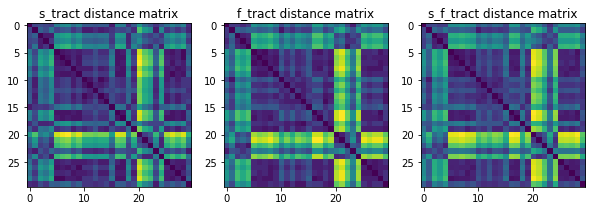

In [18]:
# visualization of distance matrix
plt.figure(figsize=(10, 10))
plt.subplot(1,3,1)
plt.imshow(s_tract_distance_matrix)
plt.title('s_tract distance matrix')



plt.subplot(1,3,2)
plt.imshow(f_tract_distance_matrix)
plt.title('f_tract distance matrix')


plt.subplot(1,3,3)
plt.imshow(s_f_distance_matrix)
plt.title('s_f_tract distance matrix')

plt.show()


In [19]:
# save min&max&mean features to an array
features_list_array=extract_features_max_min_mean()

In [20]:
print(features_list_array.shape)
# one file have 72 features

(30, 72)


These 30 data have 72 features each, and in order to visualize clustered data, I perform PCA to reduce features to 2 dimensions

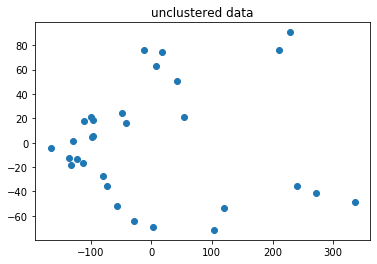

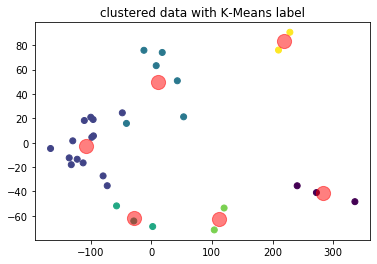

In [21]:
######  visualization of data
# The feature_list_array has a shape of (36,72), to visualize it, I use PCA to reduce its dimension to 2D.
pca = PCA(n_components=2).fit(features_list_array)
pca_2d = pca.transform(features_list_array)
plt.scatter(pca_2d[:, 0], pca_2d[:, 1])
plt.title('unclustered data')
plt.show()

# Because I choose 6 different classes of sound, the cluster number is therefore 6.
kmeans = KMeans(n_clusters=6, random_state=111)  # the model I build is KMeans with distance using 
clusters =kmeans.fit_predict(features_list_array)
plt.title('clustered data with K-Means label')
plt.scatter(pca_2d[:, 0], pca_2d[:, 1], c=kmeans.labels_)
#print(kmeans.labels_)
centers = kmeans.cluster_centers_
#print(centers.shape)
centers_2d=pca.transform(centers)
plt.scatter(centers_2d[:, 0], centers_2d[:, 1], c='red', s=200, alpha=0.5);
plt.show()

* another way to visualize the data is to plot some features, I choose P_max and T_max features, and plot them on a 2D plane

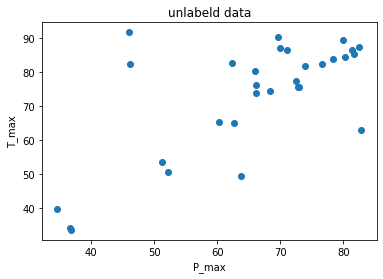

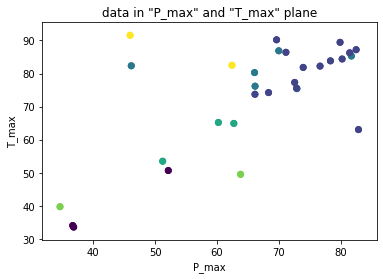

In [22]:
plt.scatter(features_list_array[:,0],features_list_array[:,3])# col 0 is p_max, col 3 is t_max
plt.title('unlabeld data')
plt.xlabel('P_max')
plt.ylabel('T_max')
plt.show()

plt.scatter(features_list_array[:,0],features_list_array[:,3],c=kmeans.labels_)# col 0 is p_max, col 3 is t_max
kmeans = KMeans(n_clusters=6, random_state=111)  # the model I build is KMeans with distance using 
clusters =kmeans.fit_predict(features_list_array)
plt.title('data in "P_max" and "T_max" plane')
plt.scatter(features_list_array[:,0],features_list_array[:,3], c=kmeans.labels_)
plt.xlabel('P_max')
plt.ylabel('T_max')
#print(kmeans.labels_)
plt.show()

* Implementation of the distance measure, with explanations in the code how it works.
 * I choose the distance been measured to be Euclidean distance. 

* Clustering the data with the given clustering methods.

In [23]:
from sklearn.cluster import AgglomerativeClustering
# HAC model using min and max features extracted from PTNE
clf_hac = AgglomerativeClustering(n_clusters=6)
hac_cluster=clf_hac.fit_predict(features_list_array)

# HAC model using histogram features from s_tract
clf_hac_s_hist = AgglomerativeClustering(n_clusters=6, affinity = 'precomputed',linkage='complete')
hac_s_hist_cluster = clf_hac_s_hist.fit_predict(s_tract_distance_matrix)

# HAC model using histogram features from f_tract
clf_hac_f_hist = AgglomerativeClustering(n_clusters=6, affinity = 'precomputed',linkage='complete')
hac_f_hist_cluster=clf_hac_f_hist.fit_predict(f_tract_distance_matrix)

# HAC model using histogram features from s_tract and f_tract
clf_hac_sf_hist = AgglomerativeClustering(n_clusters=6, affinity = 'precomputed',linkage='complete')
hac_sf_hist_cluster = clf_hac_sf_hist.fit_predict(s_f_distance_matrix)

# KMeans model
clf_kmeans=KMeans(n_clusters=6, random_state=100)
kmeans_cluster=clf_kmeans.fit_predict(features_list_array)

In [24]:
# Print the predicted labels
print(clf_hac.labels_)
print(clf_hac_s_hist.labels_)
print(clf_hac_f_hist.labels_)
print(clf_hac_sf_hist.labels_)
print(clf_kmeans.labels_)

[5 0 5 3 3 0 0 0 0 0 0 3 0 3 3 4 2 2 2 4 1 1 0 0 1 0 0 0 0 0]
[5 1 3 3 2 0 0 0 0 0 1 1 1 1 0 5 0 0 3 0 4 2 2 1 2 0 0 0 0 1]
[4 0 3 3 3 1 1 1 1 1 0 5 0 5 5 0 1 1 5 1 2 2 3 4 2 1 1 1 1 5]
[3 4 1 1 1 2 2 2 2 2 4 4 4 4 2 5 2 2 5 2 0 0 1 3 0 2 2 2 2 4]
[1 0 1 2 2 0 0 0 0 0 2 2 0 2 2 5 4 4 4 5 3 3 0 0 3 0 0 0 0 0]


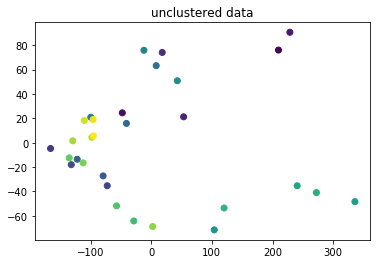

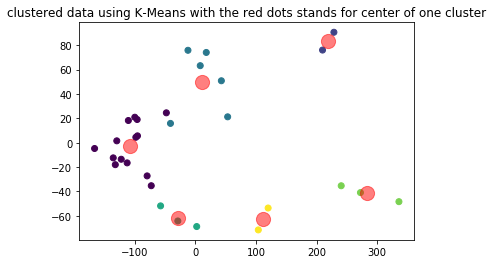

"\nplt.title('clustered data using HAC method')\nplt.scatter(pca_2d[:, 0], pca_2d[:, 1], c=clf_hac.labels_)\n#print(kmeans.labels_)\nplt.show()\n\nplt.title('clustered data using HAC_s_tract method')\nplt.scatter(pca_2d[:, 0], pca_2d[:, 1], c=clf_hac_s_hist.labels_)\n#print(kmeans.labels_)\nplt.show()\n\nplt.title('clustered data using HAC_f_tract method')\nplt.scatter(pca_2d[:, 0], pca_2d[:, 1], c=clf_hac_s_hist.labels_)\n#print(kmeans.labels_)\nplt.show()\n\nplt.title('clustered data using HAC_sf_tract method')\nplt.scatter(pca_2d[:, 0], pca_2d[:, 1], c=clf_hac_sf_hist.labels_)\n#print(kmeans.labels_)\nplt.show()\n"

In [25]:
######  visualization of data
# The feature_list_array has a shape of (30,72), to visualize it, I use PCA to reduce its dimension to 2D.
pca = PCA(n_components=2).fit(features_list_array)
pca_2d = pca.transform(features_list_array)
plt.scatter(pca_2d[:, 0], pca_2d[:, 1], c=range(features_list_array.shape[0]))
plt.title('unclustered data')
plt.show()

# Because I choose 6 different classes of sound, the cluster number is therefore 6.
plt.title('clustered data using K-Means with the red dots stands for center of one cluster')
plt.scatter(pca_2d[:, 0], pca_2d[:, 1], c=clf_kmeans.labels_)
#print(kmeans.labels_)
centers = clf_kmeans.cluster_centers_
#print(centers.shape)
centers_2d=pca.transform(centers)
plt.scatter(centers_2d[:, 0], centers_2d[:, 1], c='red', s=200, alpha=0.5);
plt.show()


'''
plt.title('clustered data using HAC method')
plt.scatter(pca_2d[:, 0], pca_2d[:, 1], c=clf_hac.labels_)
#print(kmeans.labels_)
plt.show()

plt.title('clustered data using HAC_s_tract method')
plt.scatter(pca_2d[:, 0], pca_2d[:, 1], c=clf_hac_s_hist.labels_)
#print(kmeans.labels_)
plt.show()

plt.title('clustered data using HAC_f_tract method')
plt.scatter(pca_2d[:, 0], pca_2d[:, 1], c=clf_hac_s_hist.labels_)
#print(kmeans.labels_)
plt.show()

plt.title('clustered data using HAC_sf_tract method')
plt.scatter(pca_2d[:, 0], pca_2d[:, 1], c=clf_hac_sf_hist.labels_)
#print(kmeans.labels_)
plt.show()
'''

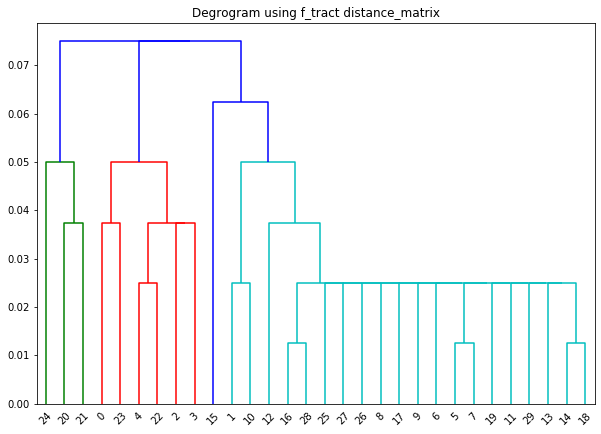

In [26]:
# Plot degrogram

from scipy.cluster.hierarchy import dendrogram, linkage
from scipy.spatial.distance import squareform


dists = squareform(f_tract_distance_matrix)
linked = linkage(dists, "single")
labelList = range(0, len(filelist))
plt.figure(figsize=(10, 7))
dendrogram(linked,
            orientation='top',
            labels=labelList,
            distance_sort='descending',
            show_leaf_counts=True)
plt.title('Degrogram using f_tract distance_matrix')
plt.show()

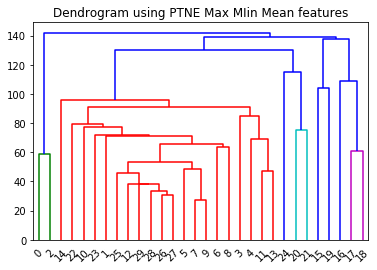

In [27]:
from scipy.cluster import hierarchy
Z = hierarchy.linkage(features_list_array, 'single')
plt.figure()
plt.title('Dendrogram using PTNE Max MIin Mean features')
dn = hierarchy.dendrogram(Z)

* Calculate the accuracy of my models

In [28]:
from scipy.stats import mode
target=np.asarray(esc50_test['target'])
kmeans_labels = np.zeros_like(kmeans_cluster)
hac_labels = np.zeros_like(hac_cluster)
hac_s_tract_labels = np.zeros_like(hac_s_hist_cluster)
hac_f_tract_labels = np.zeros_like(hac_f_hist_cluster)
hac_sf_tract_labels = np.zeros_like(hac_sf_hist_cluster)
for i in range(10):
    mask = (kmeans_cluster == i)
    kmeans_labels[mask] = mode(target[mask])[0]
for i in range(10):
    mask = (hac_cluster == i)
    hac_labels[mask] = mode(target[mask])[0]
for i in range(10):
    mask = (hac_s_hist_cluster == i)
    hac_s_tract_labels[mask] = mode(target[mask])[0]    
for i in range(10):
    mask = (hac_f_hist_cluster == i)
    hac_f_tract_labels[mask] = mode(target[mask])[0]    
for i in range(10):
    mask = (hac_sf_hist_cluster == i)
    hac_sf_tract_labels[mask] = mode(target[mask])[0]
    
print(kmeans_labels)
print(hac_labels)
print(hac_s_tract_labels)
print(hac_f_tract_labels)
print(hac_sf_tract_labels)
print(target)

[ 3 10  3 18 18 10 10 10 10 10 18 18 10 18 18 38 38 38 38 38 42 42 10 10
 42 10 10 10 10 10]
[ 3 10  3 18 18 10 10 10 10 10 10 18 10 18 18 38 38 38 38 38 42 42 10 10
 42 10 10 10 10 10]
[ 3 18  3  3 42 10 10 10 10 10 18 18 18 18 10  3 10 10  3 10 42 42 42 18
 42 10 10 10 10 18]
[ 3 18  3  3  3 10 10 10 10 10 18 18 18 18 18 18 10 10 18 10 42 42  3  3
 42 10 10 10 10 18]
[ 3 18  3  3  3 10 10 10 10 10 18 18 18 18 10 38 10 10 38 10 42 42  3  3
 42 10 10 10 10 18]
[ 3  3  3  3  3 10 10 10 10 10 18 18 18 18 18 38 38 38 38 38 42 42 42 42
 42 47 47 47 47 47]


In [29]:
from sklearn.metrics import accuracy_score
print('accuracy of kmeans: ',accuracy_score(target, kmeans_labels))
print('accuracy of HAC using max&min&mean: ',accuracy_score(target, hac_labels))
print('accuracy of HAC_s_tract: ',accuracy_score(target, hac_s_tract_labels))
print('accuracy of HAC_f_tract: ',accuracy_score(target, hac_f_tract_labels))
print('accuracy of HAC_sf_tract: ',accuracy_score(target, hac_sf_tract_labels))

accuracy of kmeans:  0.6333333333333333
accuracy of HAC using max&min&mean:  0.6
accuracy of HAC_s_tract:  0.5333333333333333
accuracy of HAC_f_tract:  0.5666666666666667
accuracy of HAC_sf_tract:  0.6


* make Confusion matrix

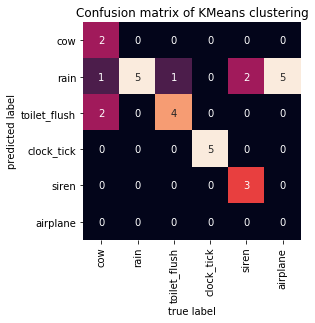

In [34]:
from sklearn.metrics import confusion_matrix
target_names=np.asarray(esc50_test['category'])
target_names=target_names[0:30:5]
mat = confusion_matrix(target, kmeans_labels)
ax=sns.heatmap(mat.T, square=True, annot=True, fmt='d', cbar=False,xticklabels=target_names,yticklabels=target_names)
plt.xlabel('true label')
plt.title('Confusion matrix of KMeans clustering')
plt.ylabel('predicted label')
plt.show()


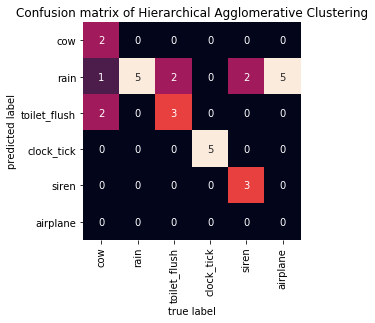

In [31]:
mat = confusion_matrix(target, hac_labels)
ax=sns.heatmap(mat.T, square=True, annot=True, fmt='d', cbar=False,xticklabels=target_names,yticklabels=target_names)
plt.xlabel('true label')
plt.title('Confusion matrix of Hierarchical Agglomerative Clustering')
plt.ylabel('predicted label')
plt.show()

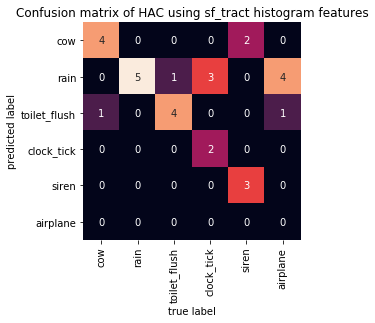

In [32]:
mat = confusion_matrix(target, hac_sf_tract_labels)
ax=sns.heatmap(mat.T, square=True, annot=True, fmt='d', cbar=False,xticklabels=target_names,yticklabels=target_names)
plt.xlabel('true label')
plt.title('Confusion matrix of HAC using sf_tract histogram features')
plt.ylabel('predicted label')
plt.show()

* From the confusion matrix, we can tell all the models I built have predicted "airplane" sounds to be "rain" or other sounds, mainly because they are both continuous sound with high frequency and the features I choose can not tell them apart (the distance between these data are close).